# Brain Tumor Detection using MRI Images

## Project Overview
This project focuses on detecting brain tumors from MRI images using deep learning techniques. The main goals are:

- Build a robust image classification model to distinguish between tumor-positive and tumor-negative MRI scans.
- Experiment with both **custom CNNs** and **pre-trained models** (EfficientNetB0, MobileNetV2, ResNet50, VGG16, InceptionV3) using **transfer learning** and **fine-tuning**.
- Apply **data augmentation** (crop, rotate, flip, shift, brightness adjustments, noise, zoom) to increase dataset size and improve model generalization.
- Monitor and mitigate overfitting using **EarlyStopping** and validation data.
- Optimize hyperparameters with **Keras Tuner** to improve model performance.

## Dataset
- Dataset: `brain-mri-images-for-brain-tumor-detection` from Kaggle
- Classes: `YES` (tumor), `NO` (no tumor)
- Original dataset size: 253 images
- Augmented dataset size: 2277 images (after crop, rotate, flip, shift, brightness, noise, zoom)

## Methodology
1. **Data Preprocessing**
   - Images resized to `224x224`
   - Pixel normalization
   - Data augmentation to increase training data and reduce overfitting

2. **Modeling**
   - Experimented with **pre-trained CNNs** and **custom CNN**
   - Applied **transfer learning** and fine-tuning for best performance
   - Used **dropout** and **L2 regularization** to mitigate overfitting

3. **Training & Evaluation**
   - Used `binary_crossentropy` loss and `Adam` optimizer
   - Monitored validation accuracy for early stopping
   - Hyperparameter tuning performed with **Keras Tuner**

## Tools & Libraries
- Python, TensorFlow / Keras
- OpenCV for image processing
- Matplotlib for visualization
- Keras Tuner for hyperparameter optimization

## Import dependencies

In [5]:
from IPython.display import clear_output
# !pip install imutils
# !pip install --upgrade tensorflow
# !pip install scikeras
clear_output()

#import tensorflow as tf
#print(tf.__version__)

In [6]:
!pip install scikit-learn==1.3.2
!pip install scikit-optimize --upgrade

In [7]:
import tensorflow as tf
import keras_tuner as kt
import numpy as np
import os
import cv2
import shutil
import itertools
import imutils
import random
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from scipy.ndimage import map_coordinates, gaussian_filter
from scikeras.wrappers import KerasClassifier

from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix

from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args


from tensorflow.keras import layers, regularizers, Sequential
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0, MobileNetV2, DenseNet169, ResNet50, VGG16, InceptionV3
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input


RANDOM_SEED = 123
IMG_SIZE = (224,224)
TRAIN_MERGE_DIR = 'TRAIN_MERGED/'
VAL_MERGE_DIR = 'VAL_MERGED/'
TEST_MERGE_DIR = 'TEST_MERGED/'
TRAIN_DIR = 'TRAIN/'
TEST_DIR = 'TEST/'
VAL_DIR = 'VAL/'

#import warnings
#warnings.filterwarnings('default')  # show all warnings

## Dataset Preparation

This section organizes the raw MRI images into **training, validation, and test sets**. 

- Each class (`YES` for tumor, `NO` for no tumor) is separated into its respective folder.
- Split:
  - **Training:** 80% of the data
  - **Validation:** 20% of the remaining data after training
  - **Test:** First 5 images of each class
- This ensures that the model can be trained, validated, and tested on separate subsets to prevent data leakage and evaluate generalization.
- The code automatically creates the folder structure and copies images accordingly.

In [8]:
IMG_PATH = "/kaggle/input/brain-mri-images-for-brain-tumor-detection/brain_tumor_dataset/"

# create folders
for split in ['TRAIN', 'VAL', 'TEST']:
    for class_name in ['YES', 'NO']:
        os.makedirs(f'{split}/{class_name}', exist_ok=True)

# split dataset
for CLASS in os.listdir(IMG_PATH):
    if not CLASS.startswith('.'):
        IMG_NUM = len(os.listdir(IMG_PATH + CLASS))
        for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH + CLASS)):
            img = IMG_PATH + CLASS + '/' + FILE_NAME
            if n < 5:
                shutil.copy(img, 'TEST/' + CLASS.upper() + '/' + FILE_NAME)
            elif n < 0.8*IMG_NUM:
                shutil.copy(img, 'TRAIN/'+ CLASS.upper() + '/' + FILE_NAME)
            else:
                shutil.copy(img, 'VAL/'+ CLASS.upper() + '/' + FILE_NAME)

# print results
for split in ['TRAIN', 'VAL', 'TEST']:
    for class_name in ['YES', 'NO']:
        path = f'{split}/{class_name}'
        num_files = len(os.listdir(path))
        print(f"{split}/{class_name} has {num_files} images")

TRAIN/YES has 119 images
TRAIN/NO has 74 images
VAL/YES has 31 images
VAL/NO has 19 images
TEST/YES has 5 images
TEST/NO has 5 images


X_train shape: (193, 224, 224, 3)
y_train shape: (193, 1)
X_val shape: (50, 224, 224, 3)
y_val shape: (50, 1)
X_test shape: (10, 224, 224, 3)
y_test shape: (10, 1)
Labels: ['NO' 'YES']


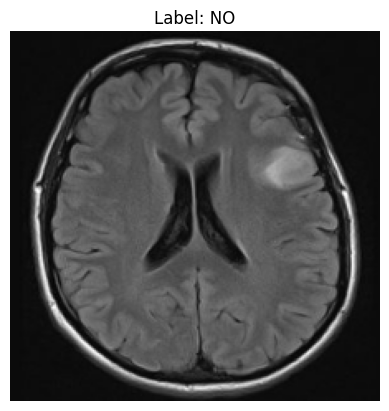

In [9]:
def load_data(data_dir, img_size):
    X = []
    y = []
    labels = []
    
    for class_name in os.listdir(data_dir):
        if class_name.startswith('.'):
            continue
        class_path = os.path.join(data_dir, class_name)
        labels.append(class_name)
        for img_file in os.listdir(class_path):
            img_path = os.path.join(class_path, img_file)
            img = cv2.imread(img_path)          
            if img is None:
                print("None: ", img)
                continue                        
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
            img = cv2.resize(img, img_size)    
            X.append(img)
            y.append(class_name)
    
    X = np.array(X, dtype='float32')
    y = np.array(y)
    
    # Label encode
    lb = LabelBinarizer()
    y = lb.fit_transform(y)
    
    return X, y, lb.classes_

# use predefined function to load the image data into workspace
X_train, y_train, labels = load_data(TRAIN_DIR, IMG_SIZE)
X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)
print("Labels:", labels)


plt.imshow(X_train[0].astype('uint8'))
plt.title(f"Label: {labels[np.argmax(y_train[0])]}")
plt.axis('off')
plt.show()

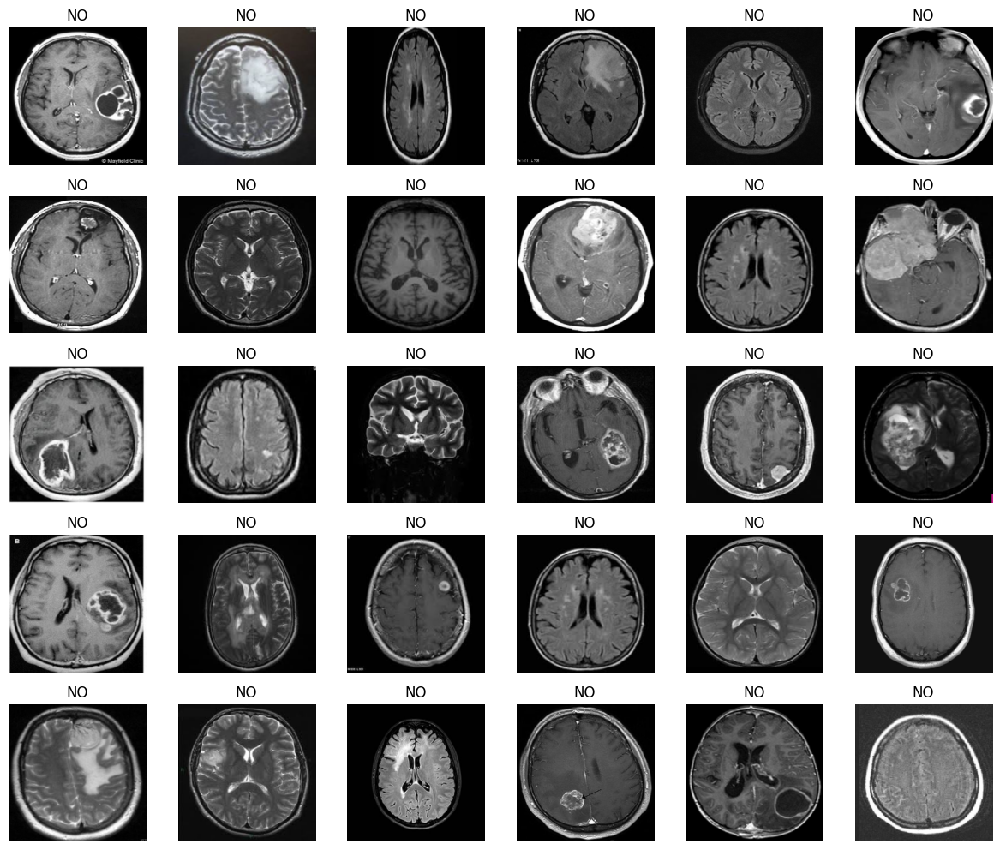

In [10]:
def plot_samples(X, y, labels=None, n_samples=25):
    """
    X: image data (numpy array)
    y: one-hot or encoded label array
    labels: class names (optional)
    n_samples: number of samples to display
    """
    plt.figure(figsize=(12,12))
    indices = np.random.choice(len(X), n_samples, replace=False)
    for i, idx in enumerate(indices):
        plt.subplot(int(np.sqrt(n_samples))+1, int(np.sqrt(n_samples))+1, i+1)
        plt.imshow(X[idx].astype('uint8'))
        plt.axis('off')
        if labels is not None:
            plt.title(labels[np.argmax(y[idx])])
    plt.tight_layout()
    plt.show()
    
plot_samples(X_train, y_train, labels, 30)

## Image Preprocessing: Crop Example

A sample MRI image is cropped to focus on the tumor region. Steps:
1. Convert to RGB and apply Gaussian blur to reduce noise.
2. Apply thresholding and erosion/dilation to highlight the main tumor area.
3. Detect contours and select the largest one.
4. Find extreme points and crop the image.
5. Cropped image is ready for model training.

> This is a demo for cropping; the same process will be applied to the full dataset.

In [11]:
img = cv2.imread('../input/brain-mri-images-for-brain-tumor-detection/brain_tumor_dataset/yes/Y108.jpg')
img = cv2.resize(
            img,
            dsize=IMG_SIZE,
            interpolation=cv2.INTER_CUBIC
        )
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)

# threshold the image, then perform a series of erosions +
# dilations to remove any small regions of noise
thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.dilate(thresh, None, iterations=2)

# find contours in thresholded image, then grab the largest one
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

# find the extreme points
extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])

# add contour on the image
img_cnt = cv2.drawContours(img.copy(), [c], -1, (0, 255, 255), 4)

# add extreme points
img_pnt = cv2.circle(img_cnt.copy(), extLeft, 8, (0, 0, 255), -1)
img_pnt = cv2.circle(img_pnt, extRight, 8, (0, 255, 0), -1)
img_pnt = cv2.circle(img_pnt, extTop, 8, (255, 0, 0), -1)
img_pnt = cv2.circle(img_pnt, extBot, 8, (255, 255, 0), -1)

# crop
ADD_PIXELS = 0
new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

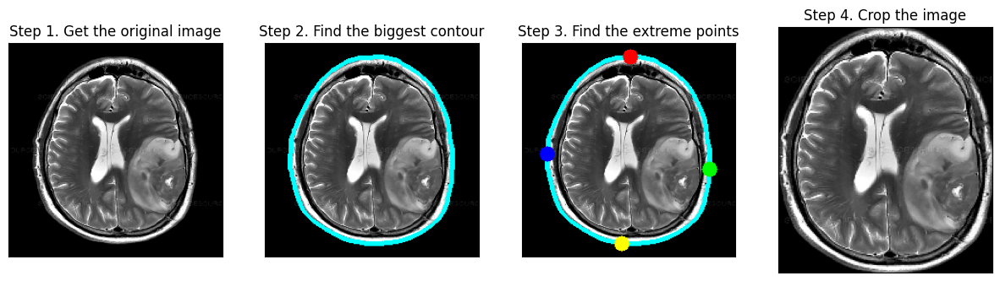

In [12]:
plt.figure(figsize=(15,6))
plt.subplot(141)
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.title('Step 1. Get the original image')
plt.subplot(142)
plt.imshow(img_cnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 2. Find the biggest contour')
plt.subplot(143)
plt.imshow(img_pnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 3. Find the extreme points')
plt.subplot(144)
plt.imshow(new_img)
plt.xticks([])
plt.yticks([])
plt.title('Step 4. Crop the image')
plt.show()

## Data Augmentation

In order to increase the size and diversity of our brain MRI dataset, several data augmentation techniques have been applied. These augmentations help the model generalize better and reduce overfitting.

### Applied Augmentation Methods

1. **Cropping**
   - Extracted the region of interest (brain area) from each image.
   - Images were resized to `(224, 224)` after cropping.
   - Helps focus the model on relevant areas and remove unnecessary background.

2. **Rotation**
   - Random rotations applied within a specified range (e.g., ±30 degrees).
   - Rotation was applied on the cropped images to preserve the ROI.
   - Increases orientation invariance of the model.

3. **Flipping**
   - Horizontal and vertical flips applied.
   - Introduces mirror images to the dataset, improving robustness.

4. **Shifting**
   - Random translations along x and y axes (e.g., 10% of image size).
   - Makes the model less sensitive to object positions.

5. **Zooming**
   - Zoom in (factor > 1) or zoom out (factor < 1).
   - Zooming in crops the image centrally, zooming out pads the image with black borders.
   - Increases scale invariance.

6. **Brightness & Contrast Adjustment**
   - Random adjustments applied to brightness and contrast.
   - Simulates different lighting conditions.

7. **Adding Noise**
   - Gaussian noise added with specified mean and standard deviation.
   - Helps the model learn to ignore small artifacts.

8. **Elastic Deformation**
   - Applies smooth, random local deformations to the images.
   - Improves model robustness to small shape variations.

### Summary

- Starting dataset: 193 images per class.  
- After all augmentation techniques: 1737 images in the training set.  
- Validation and test sets were also augmented separately for robustness checks.  
- All images were resized to `(224, 224)` and maintained RGB channels.

These augmentations were implemented using OpenCV, NumPy, and SciPy, ensuring a wide range of transformations while preserving the essential features of the brain MRI scans.

Cropped shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


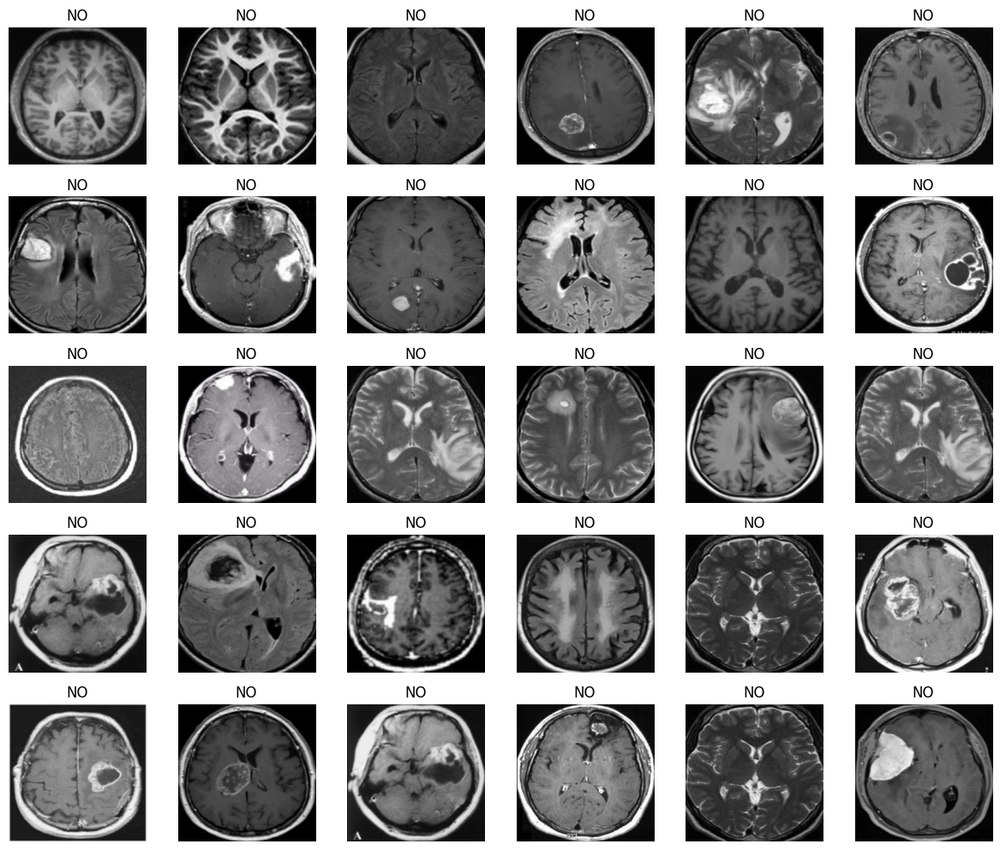

In [13]:
def crop_imgs(set_name, add_pixels_value=0, img_size=(224,224)):
    set_new = []
    for img in set_name:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = thresh.astype(np.uint8)
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        extLeft = max(0, c[c[:, :, 0].argmin()][0][0])
        extRight = min(img.shape[1], c[c[:, :, 0].argmax()][0][0])
        extTop = max(0, c[c[:, :, 1].argmin()][0][1])
        extBot = min(img.shape[0], c[c[:, :, 1].argmax()][0][1])

        ADD_PIXELS = add_pixels_value
        new_img = img[extTop-ADD_PIXELS:extBot+ADD_PIXELS, extLeft-ADD_PIXELS:extRight+ADD_PIXELS].copy()

        # Resize to a single size
        new_img = cv2.resize(new_img, img_size)
        set_new.append(new_img)
    return np.array(set_new)

# apply this for each set
X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

print("Cropped shapes:", X_train_crop.shape, X_val_crop.shape, X_test_crop.shape)
plot_samples(X_train_crop, y_train, labels, 30)

Rotated shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


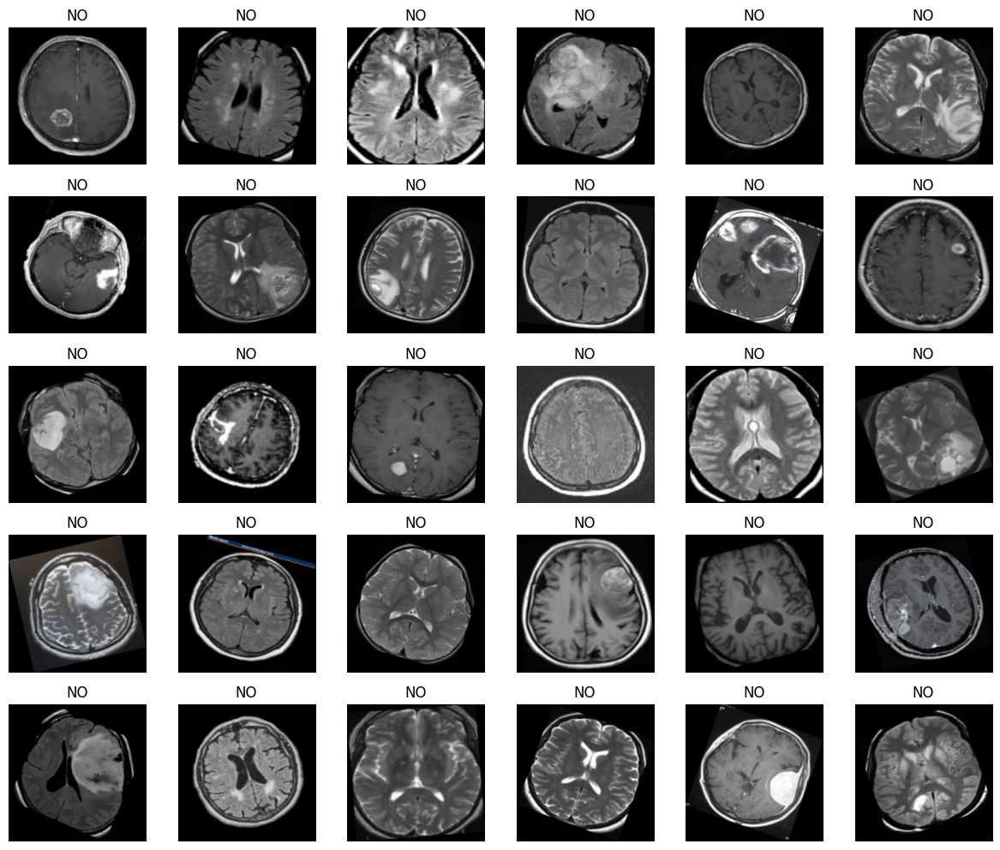

In [14]:
def rotate_images(set_name, img_size=(224,224), rotation_range=30):
    """
    Only rotates images that have been rotated.
    set_name: numpy array image list (RGB)
    img_size: output size
    rotation_range: random rotation between -rotation_range and +rotation_range
    """
    set_new = []
    for img in set_name:
        # Select random angle
        angle = np.random.uniform(-rotation_range, rotation_range)
        # Rotate
        rotated_img = imutils.rotate_bound(img, angle)
        # Fix size
        rotated_img = cv2.resize(rotated_img, img_size)
        set_new.append(rotated_img)
        
    return np.array(set_new)

# Apply random rotation to the cropped images to augment the dataset
# This increases data diversity while keeping the tumor region centered
X_train_rotate = rotate_images(set_name=X_train_crop)
X_val_rotate = rotate_images(set_name=X_val_crop)
X_test_rotate = rotate_images(set_name=X_test_crop)

print("Rotated shapes:", 
      X_train_rotate.shape, 
      X_val_rotate.shape, 
      X_test_rotate.shape)
plot_samples(X_train_rotate, y_train, labels, 30)

Fliped shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


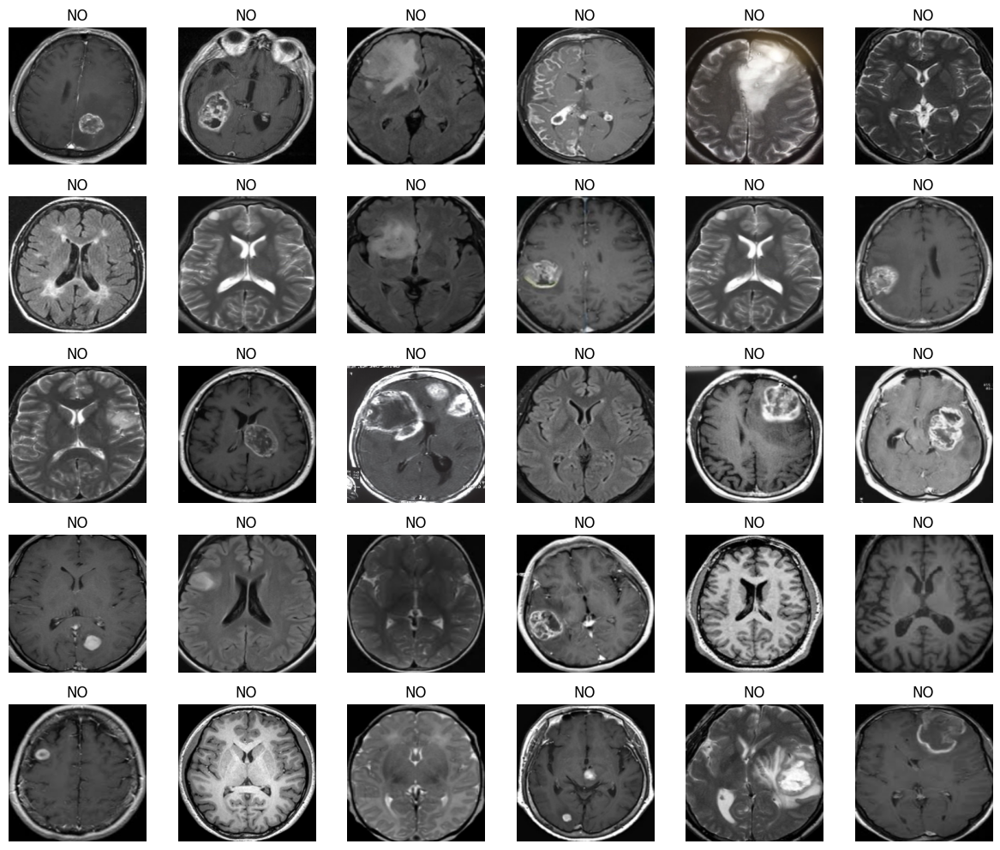

In [15]:
def flip_images(set_name, mode='horizontal', img_size=(224,224)):
    """
    mode: 'horizontal' (right–left), 'vertical' (up–down)
    """
    set_new = []
    for img in set_name:
        if mode == 'horizontal':
            flipped = cv2.flip(img, 1)   # left-right
        elif mode == 'vertical':
            flipped = cv2.flip(img, 0)   # up-down
        else:
            raise ValueError("mode must be 'horizontal' or 'vertical'")
        flipped = cv2.resize(flipped, img_size)
        set_new.append(flipped)
    return np.array(set_new)

# Apply horizontal flip on cropped images to increase dataset diversity
X_train_flip = flip_images(set_name=X_train_crop, mode='horizontal')
X_val_flip = flip_images(set_name=X_val_crop, mode='horizontal')
X_test_flip = flip_images(set_name=X_test_crop, mode='horizontal')

print("Fliped shapes:", 
      X_train_flip.shape, 
      X_val_flip.shape, 
      X_test_flip.shape)
plot_samples(X_train_flip, y_train, labels, 30)

Shifted shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


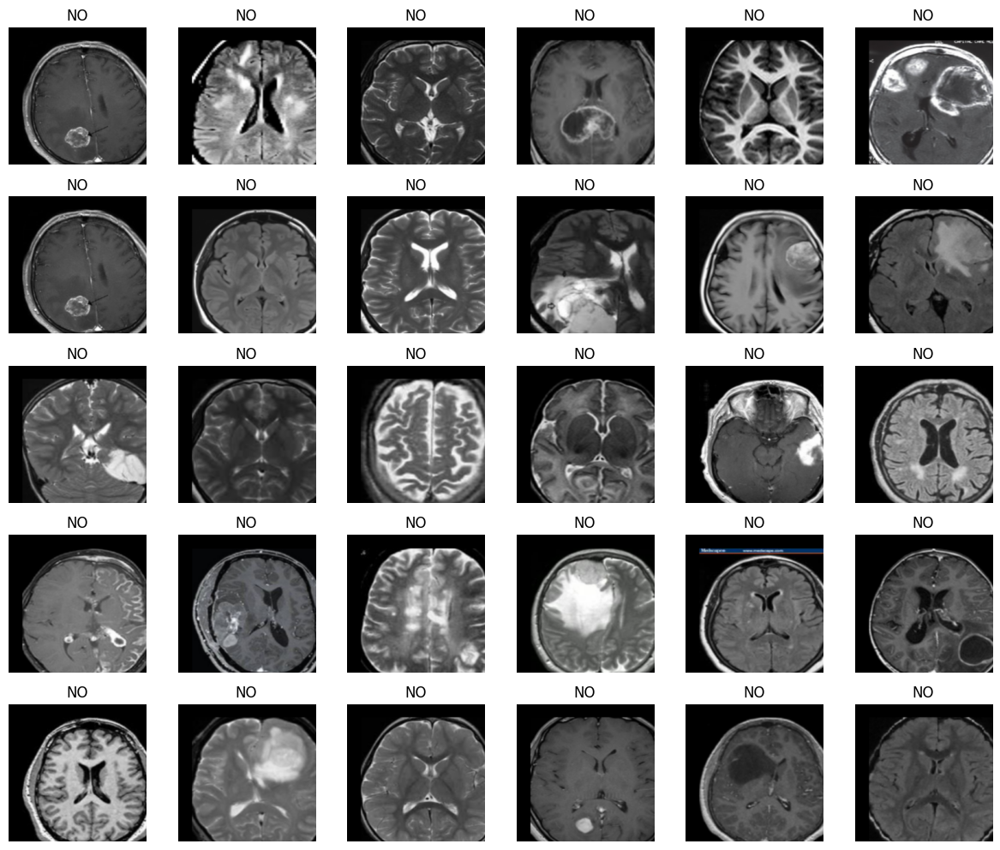

In [16]:
def shift_images(set_name, x_shift=0.1, y_shift=0.1, img_size=(224,224)):
    """
    set_name : numpy array
        List of images (RGB)
    x_shift, y_shift : float
        Fraction of total width/height to shift (e.g., 0.1 = 10%)
    img_size : tuple
        Output image size (height, width)
    """
    set_new = []
    h, w = img_size
    for img in set_name:
        M = np.float32([[1, 0, x_shift*w], [0, 1, y_shift*h]])
        shifted = cv2.warpAffine(img, M, (w, h))
        set_new.append(shifted)
    return np.array(set_new)

# Apply shift on cropped images
X_train_shift = shift_images(set_name=X_train_crop, x_shift=0.1, y_shift=0.1)
X_val_shift = shift_images(set_name=X_val_crop, x_shift=0.1, y_shift=0.1)
X_test_shift = shift_images(set_name=X_test_crop, x_shift=0.1, y_shift=0.1)

print("Shifted shapes:", 
      X_train_shift.shape, 
      X_val_shift.shape, 
      X_test_shift.shape)
plot_samples(X_train_shift, y_train, labels, 30)

Zoomed shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


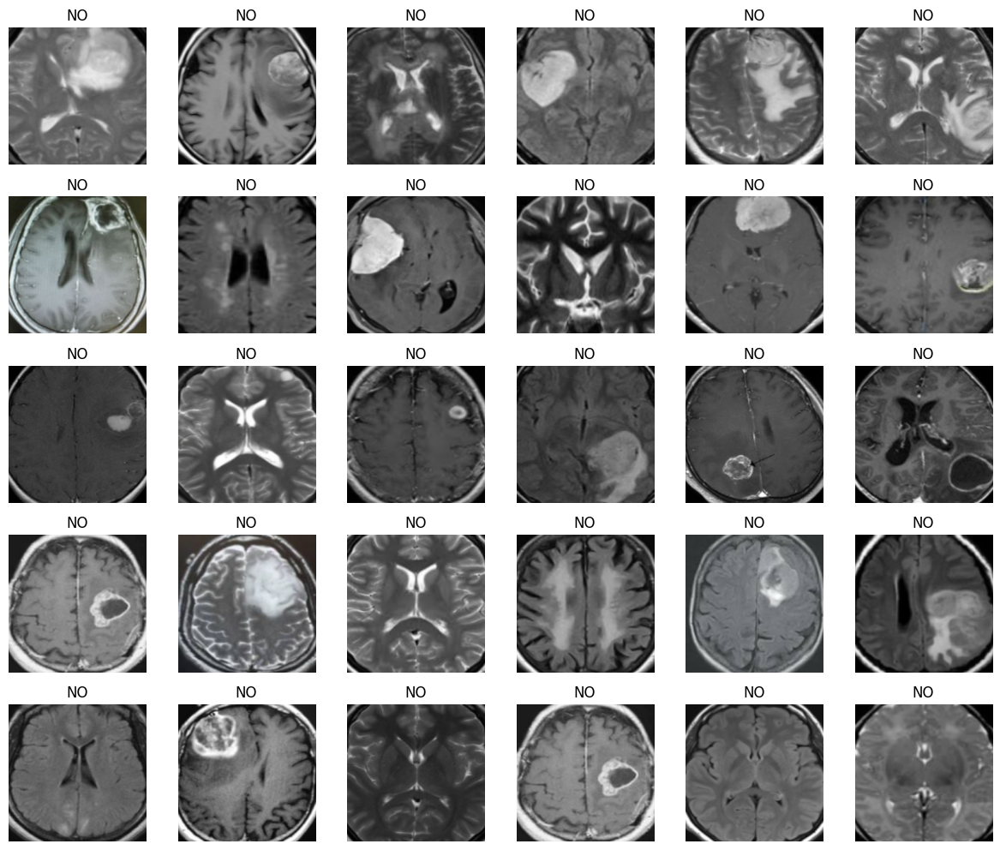

In [17]:
def zoom_images(set_name, zoom_factor=1.2, img_size=(224,224)):
    """
    set_name : numpy array
        List of images (RGB)
    zoom_factor : float
        >1 → zoom in, <1 → zoom out
    img_size : tuple
        Output image size (height, width)
    """
    set_new = []
    h, w = img_size
    for img in set_name:
        # Compute new size
        new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
        zoomed = cv2.resize(img, (new_w, new_h))
        
        # Zoom in → crop, Zoom out → pad
        if zoom_factor > 1:
            start_x = (new_w - w) // 2
            start_y = (new_h - h) // 2
            zoomed = zoomed[start_y:start_y+h, start_x:start_x+w]
        else:
            pad_x = (w - new_w) // 2
            pad_y = (h - new_h) // 2
            zoomed = cv2.copyMakeBorder(
                zoomed, pad_y, pad_y, pad_x, pad_x, cv2.BORDER_CONSTANT, value=(0,0,0)
            )
        set_new.append(cv2.resize(zoomed, img_size))
    return np.array(set_new)

# Apply zoom on cropped images
X_train_zoom = zoom_images(set_name=X_train_crop, zoom_factor=1.2)
X_val_zoom = zoom_images(set_name=X_val_crop, zoom_factor=1.2)
X_test_zoom = zoom_images(set_name=X_test_crop, zoom_factor=1.2)

print("Zoomed shapes:", 
      X_train_zoom.shape, 
      X_val_zoom.shape, 
      X_test_zoom.shape)
plot_samples(X_train_zoom, y_train, labels, 30)

Bright shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


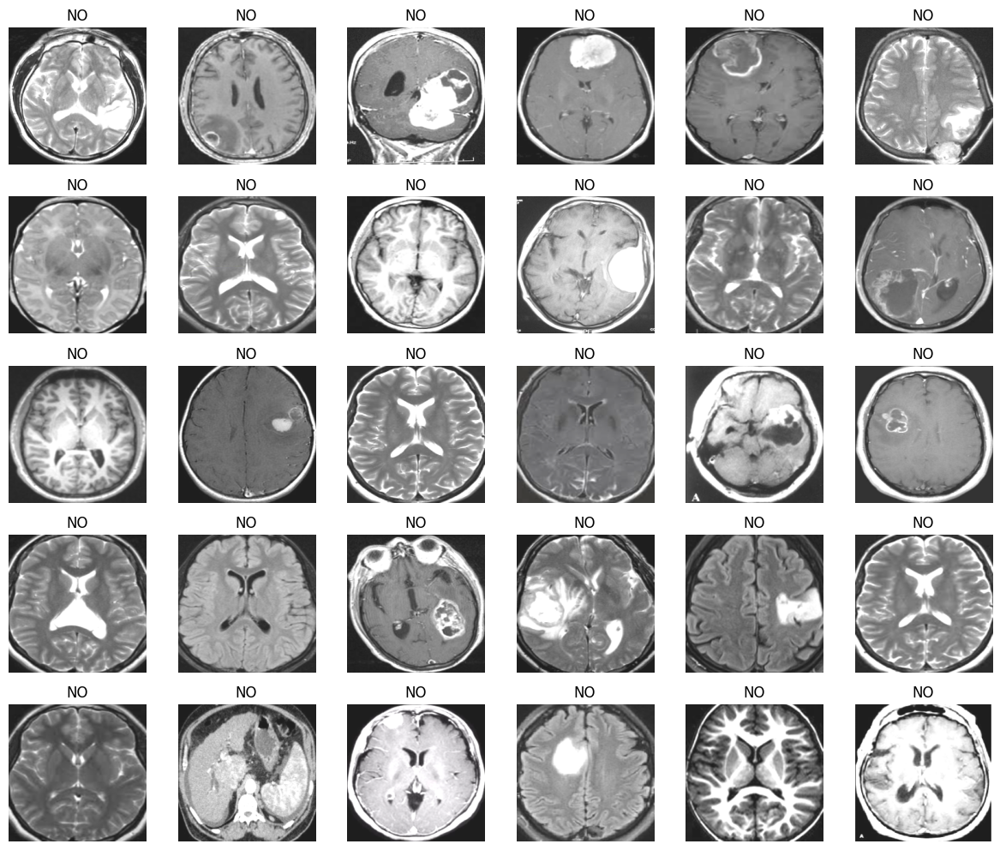

In [18]:
def adjust_brightness_contrast(set_name, brightness=30, contrast=30, img_size=(224,224)):
    """
    Adjust brightness and contrast of images.
    set_name : numpy array
        List of images (RGB)
    brightness : int
        Brightness adjustment (-100 to 100)
    contrast : int
        Contrast adjustment (-100 to 100)
    img_size : tuple
        Output image size (height, width)
    """
    set_new = []
    for img in set_name:
        new_img = cv2.convertScaleAbs(img, alpha=1 + contrast/100, beta=brightness)
        new_img = cv2.resize(new_img, img_size)
        set_new.append(new_img)
    return np.array(set_new)

# Apply brightness/contrast on cropped images
X_train_bright = adjust_brightness_contrast(set_name=X_train_crop, brightness=30, contrast=30)
X_val_bright = adjust_brightness_contrast(set_name=X_val_crop, brightness=30, contrast=30)
X_test_bright = adjust_brightness_contrast(set_name=X_test_crop, brightness=30, contrast=30)

print("Bright shapes:", 
      X_train_bright.shape, 
      X_val_bright.shape, 
      X_test_bright.shape)
plot_samples(X_train_bright, y_train, labels, 30)

Noise shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


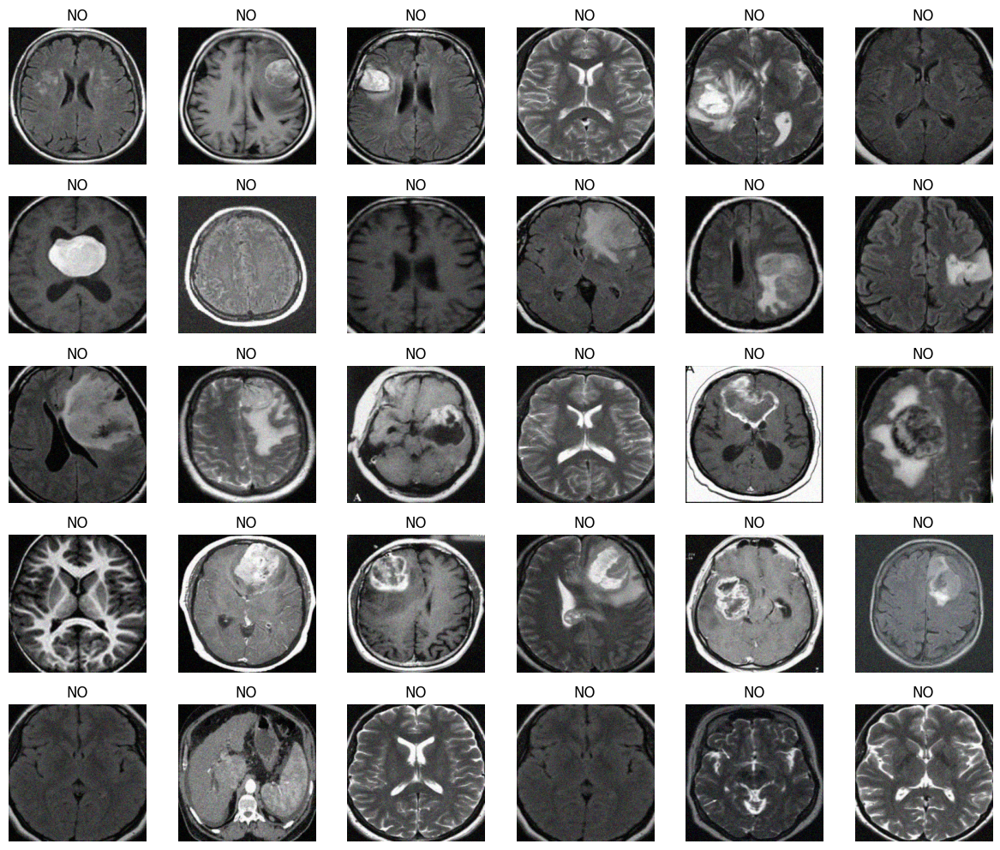

In [19]:
def add_noise(set_name, mean=0, std=15, img_size=(224,224)):
    """
    Add Gaussian noise to images.
    set_name : numpy array
        List of images (RGB)
    mean : float
        Mean of Gaussian noise
    std : float
        Standard deviation of Gaussian noise
    img_size : tuple
        Output image size (height, width)
    """
    set_new = []
    for img in set_name:
        noise = np.random.normal(mean, std, img.shape).astype(np.float32)
        noisy_img = np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)
        noisy_img = cv2.resize(noisy_img, img_size)
        set_new.append(noisy_img)
    return np.array(set_new)

# Apply noise on cropped images
X_train_noise = add_noise(set_name=X_train_crop)
X_val_noise = add_noise(set_name=X_val_crop)
X_test_noise = add_noise(set_name=X_test_crop)

print("Noise shapes:", 
      X_train_noise.shape, 
      X_val_noise.shape, 
      X_test_noise.shape)
plot_samples(X_train_noise, y_train, labels, 30)

Elastic shapes: (193, 224, 224, 3) (50, 224, 224, 3) (10, 224, 224, 3)


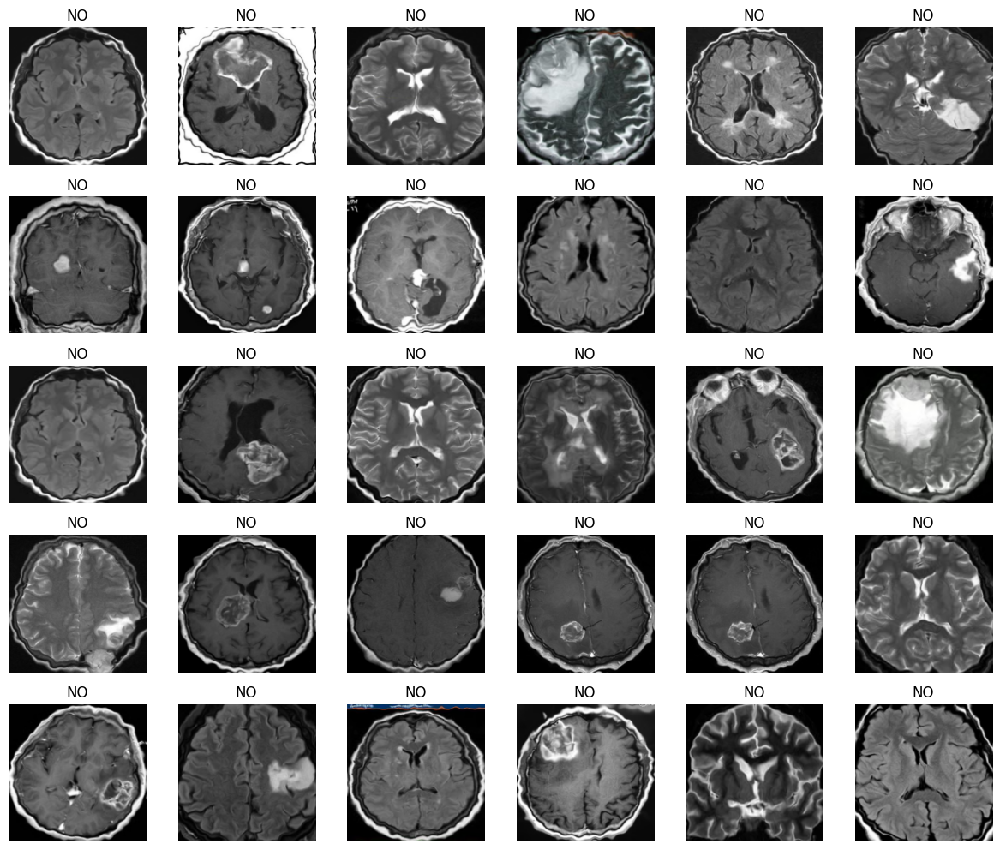

In [20]:
def elastic_deformation(images, alpha=34, sigma=4, img_size=(224,224), random_state=None):
    """
    Apply elastic deformation to a batch of images
    images : numpy array
        Input images (H, W, C)
    alpha : float
        Scaling factor for deformation intensity
    sigma : float
        Standard deviation for Gaussian filter (smoothness)
    img_size : tuple
        Output size (height, width)
    random_state : int or None
        Seed for reproducibility
    """
    if random_state is not None:
        np.random.seed(random_state)

    h, w = img_size
    deformed_images = []

    for img in images:
        # Convert to float32
        img_float = img.astype(np.float32)

        # Random displacement fields
        dx = gaussian_filter((np.random.rand(h, w) * 2 - 1), sigma) * alpha
        dy = gaussian_filter((np.random.rand(h, w) * 2 - 1), sigma) * alpha

        # Create meshgrid
        x, y = np.meshgrid(np.arange(w), np.arange(h))

        # Distort indices
        indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))

        # Apply mapping for each channel
        deformed = np.zeros_like(img_float)
        for i in range(img.shape[2]):
            deformed[:,:,i] = map_coordinates(img_float[:,:,i], indices, order=1, mode='reflect').reshape(h, w)

        deformed_images.append(deformed.astype(np.uint8))

    return np.array(deformed_images)

X_train_elastic = elastic_deformation(X_train_crop, alpha=34, sigma=4, img_size=(224,224))
X_val_elastic = elastic_deformation(X_val_crop, alpha=34, sigma=4, img_size=(224,224))
X_test_elastic = elastic_deformation(X_test_crop, alpha=34, sigma=4, img_size=(224,224))

print("Elastic shapes:", 
      X_train_elastic.shape, 
      X_val_elastic.shape, 
      X_test_elastic.shape)

plot_samples(X_train_elastic, y_train, labels, 30)

In [21]:
# Save augmented images to folders
# X: image array (NumPy)
# y: labels (one-hot or integer encoded)
# labels: class names list, e.g., ['NO', 'YES']
# folder_name: target directory for saving images
def save_new_images(X, y, labels, folder_name='DATA/'):
    if labels is None:
        raise ValueError("The labels parameter must be given!")

    # Handle one-hot encoded labels
    if len(y.shape) > 1 and y.shape[1] > 1:
        y_labels = np.argmax(y, axis=1)
    else:
        y_labels = y.flatten()  # flat array for single-label

    for i, img in enumerate(X):
        label = labels[y_labels[i]]  # get class name
        save_path = os.path.join(folder_name, label)
        os.makedirs(save_path, exist_ok=True)

        # Convert image to uint8 (0-255) if not already
        img_uint8 = img.copy()
        if img_uint8.dtype != np.uint8:
            img_uint8 = ((img_uint8 - img_uint8.min()) / (img_uint8.max() - img_uint8.min()) * 255).astype(np.uint8)

         # OpenCV uses BGR format for saving
        cv2.imwrite(os.path.join(save_path, f'{i}.jpg'), cv2.cvtColor(img_uint8, cv2.COLOR_RGB2BGR))

In [22]:
all_augmented_folders = ['TRAIN_CROP', 
               'VAL_CROP', 
               'TEST_CROP',
               'TRAIN_ROTATE', 
               'VAL_ROTATE', 
               'TEST_ROTATE',
               'TRAIN_FLIP', 
               'VAL_FLIP', 
               'TEST_FLIP',
               'TRAIN_SHIFT', 
               'VAL_SHIFT', 
               'TEST_SHIFT',
               'TRAIN_ZOOM', 
               'VAL_ZOOM', 
               'TEST_ZOOM',
               'TRAIN_BRIGHT', 
               'VAL_BRIGHT', 
               'TEST_BRIGHT',
               'TRAIN_NOISE', 
               'VAL_NOISE', 
               'TEST_NOISE',        
               'TRAIN_ELASTIC', 
               'VAL_ELASTIC', 
               'TEST_ELASTIC'
              ]

for folder in all_augmented_folders:
    if os.path.exists(folder):
        shutil.rmtree(folder)
        
save_new_images(X_train_crop, y_train, labels=labels, folder_name='TRAIN_CROP/')
save_new_images(X_val_crop, y_val, labels=labels, folder_name='VAL_CROP/')
save_new_images(X_test_crop, y_test, labels=labels, folder_name='TEST_CROP/')

save_new_images(X_train_rotate, y_train, labels=labels, folder_name='TRAIN_ROTATE/')
save_new_images(X_val_rotate, y_val, labels=labels, folder_name='VAL_ROTATE/')
save_new_images(X_test_rotate, y_test, labels=labels, folder_name='TEST_ROTATE/')

save_new_images(X_train_flip, y_train, labels=labels, folder_name='TRAIN_FLIP/')
save_new_images(X_val_flip, y_val, labels=labels, folder_name='VAL_FLIP/')
save_new_images(X_test_flip, y_test, labels=labels, folder_name='TEST_FLIP/')

save_new_images(X_train_shift, y_train, labels=labels, folder_name='TRAIN_SHIFT/')
save_new_images(X_val_shift, y_val, labels=labels, folder_name='VAL_SHIFT/')
save_new_images(X_test_shift, y_test, labels=labels, folder_name='TEST_SHIFT/')

save_new_images(X_train_zoom, y_train, labels=labels, folder_name='TRAIN_ZOOM/')
save_new_images(X_val_zoom, y_val, labels=labels, folder_name='VAL_ZOOM/')
save_new_images(X_test_zoom, y_test, labels=labels, folder_name='TEST_ZOOM/')

save_new_images(X_train_bright, y_train, labels=labels, folder_name='TRAIN_BRIGHT/')
save_new_images(X_val_bright, y_val, labels=labels, folder_name='VAL_BRIGHT/')
save_new_images(X_test_bright, y_test, labels=labels, folder_name='TEST_BRIGHT/')

save_new_images(X_train_noise, y_train, labels=labels, folder_name='TRAIN_NOISE/')
save_new_images(X_val_noise, y_val, labels=labels, folder_name='VAL_NOISE/')
save_new_images(X_test_noise, y_test, labels=labels, folder_name='TEST_NOISE/')

save_new_images(X_train_elastic, y_train, labels=labels, folder_name='TRAIN_ELASTIC/')
save_new_images(X_val_elastic, y_val, labels=labels, folder_name='VAL_ELASTIC/')
save_new_images(X_test_elastic, y_test, labels=labels, folder_name='TEST_ELASTIC/')

"""for folder in all_augmented_folders:
    print(f"{folder} içeriği:", os.listdir(folder))
    for class_name in ['YES', 'NO']:
        class_path = os.path.join(folder, class_name)
        if os.path.exists(class_path):
            print(f"  {class_name} sayısı:", len(os.listdir(class_path)))
"""

print("X_train: ", X_train.shape)
print("X_train_crop: ", X_train_crop.shape)
print("X_train_rotate: ", X_train_rotate.shape)
print("X_train_flip: ", X_train_flip.shape)
print("X_train_shift: ", X_train_shift.shape)
print("X_train_zoom: ", X_train_zoom.shape)
print("X_train_bright: ", X_train_bright.shape)
print("X_train_noise: ", X_train_noise.shape)
print("X_train_elastic: ", X_train_elastic.shape)

X_train:  (193, 224, 224, 3)
X_train_crop:  (193, 224, 224, 3)
X_train_rotate:  (193, 224, 224, 3)
X_train_flip:  (193, 224, 224, 3)
X_train_shift:  (193, 224, 224, 3)
X_train_zoom:  (193, 224, 224, 3)
X_train_bright:  (193, 224, 224, 3)
X_train_noise:  (193, 224, 224, 3)
X_train_elastic:  (193, 224, 224, 3)


### Merge folders

In [23]:
def merge_folder(folders_to_merge, merged_dir):
    for folder in folders_to_merge:
        for class_name in ['YES', 'NO']:
            src_dir = os.path.join(folder, class_name)
            dst_dir = os.path.join(merged_dir, class_name)
            os.makedirs(dst_dir, exist_ok=True)
            
            for i, fname in enumerate(os.listdir(src_dir)):
                src_path = os.path.join(src_dir, fname)
                # benzersiz isim üret
                new_fname = f"{os.path.basename(folder)}_{i}_{fname}"
                dst_path = os.path.join(dst_dir, new_fname)
                shutil.copy(src_path, dst_path)


def clean_folders(folders):
    for folder in folders:
        if os.path.exists(folder):
            shutil.rmtree(folder)
            print(f"{folder} deleted.")
        else:
            print(f"{folder} not found")

In [24]:
train_folders_to_merge = ['TRAIN', 
                          'TRAIN_CROP', 
                          'TRAIN_ROTATE',
                          'TRAIN_FLIP',
                          'TRAIN_SHIFT',
                          'TRAIN_ZOOM',
                          'TRAIN_BRIGHT',
                          'TRAIN_NOISE',
                          'TRAIN_ELASTIC'
                         ]

val_folders_to_merge = ['VAL', 
                        'VAL_CROP', 
                        'VAL_ROTATE',
                        'VAL_FLIP',
                        'VAL_SHIFT',
                        'VAL_ZOOM',
                        'VAL_BRIGHT',
                        'VAL_NOISE',
                        'VAL_ELASTIC'
                       ]


test_folders_to_merge = ['TEST', 
                         'TEST_CROP', 
                         'TEST_ROTATE',
                         'TEST_FLIP',
                         'TEST_SHIFT',
                         'TEST_ZOOM',
                         'TEST_BRIGHT',
                         'TEST_NOISE',
                         'TEST_ELASTIC'
                        ]


if os.path.exists(TRAIN_MERGE_DIR):
    shutil.rmtree(TRAIN_MERGE_DIR)  

if os.path.exists(VAL_MERGE_DIR):
    shutil.rmtree(VAL_MERGE_DIR) 

if os.path.exists(TEST_MERGE_DIR):
    shutil.rmtree(TEST_MERGE_DIR)  

merge_folder(train_folders_to_merge, TRAIN_MERGE_DIR)
merge_folder(val_folders_to_merge, VAL_MERGE_DIR)
merge_folder(test_folders_to_merge, TEST_MERGE_DIR)

clean_folders(train_folders_to_merge)
clean_folders(val_folders_to_merge)
clean_folders(test_folders_to_merge)


for class_name in ['YES', 'NO']:
    class_dir = os.path.join(TRAIN_MERGE_DIR, class_name)
    files = os.listdir(class_dir)
    print(class_name, len(files))

TRAIN deleted.
TRAIN_CROP deleted.
TRAIN_ROTATE deleted.
TRAIN_FLIP deleted.
TRAIN_SHIFT deleted.
TRAIN_ZOOM deleted.
TRAIN_BRIGHT deleted.
TRAIN_NOISE deleted.
TRAIN_ELASTIC deleted.
VAL deleted.
VAL_CROP deleted.
VAL_ROTATE deleted.
VAL_FLIP deleted.
VAL_SHIFT deleted.
VAL_ZOOM deleted.
VAL_BRIGHT deleted.
VAL_NOISE deleted.
VAL_ELASTIC deleted.
TEST deleted.
TEST_CROP deleted.
TEST_ROTATE deleted.
TEST_FLIP deleted.
TEST_SHIFT deleted.
TEST_ZOOM deleted.
TEST_BRIGHT deleted.
TEST_NOISE deleted.
TEST_ELASTIC deleted.
YES 1071
NO 666


### Data Augmentation Result

In [ ]:
merged_dirs = {
    'Train': TRAIN_MERGE_DIR,
    'Validation': VAL_MERGE_DIR,
    'Test': TEST_MERGE_DIR
}

data_counts = {}
for split_name, dir_path in merged_dirs.items():
    total = 0
    for class_name in ['YES', 'NO']:
        class_dir = os.path.join(dir_path, class_name)
        total += len(os.listdir(class_dir))
    data_counts[split_name] = total

labels = list(data_counts.keys())
sizes = list(data_counts.values())
colors = ['#66b3ff', '#99ff99', '#ffcc99']

plt.figure(figsize=(7,7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title("Train / Validation / Test Dataset Distribution")
plt.show()

## Train Data

In [26]:
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess
from tensorflow.keras.applications.inception_v3 import preprocess_input as inception_preprocess

def get_generators(train_dir, val_dir, img_size=(224,224), batch_size=32, seed=123, preprocess_func=None):
    train_datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        brightness_range=[0.5, 1.5],
        horizontal_flip=True,
        vertical_flip=True,
        preprocessing_function=preprocess_func
    )
    
    test_datagen = ImageDataGenerator(preprocessing_function=preprocess_func)
    
    train_gen = train_datagen.flow_from_directory(
        train_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='binary',
        seed=seed
    )
    
    val_gen = test_datagen.flow_from_directory(
        val_dir,
        target_size=img_size,
        batch_size=batch_size//2,
        class_mode='binary',
        seed=seed
    )
    
    return train_gen, val_gen

The following method (`` plot_training_history ``) will be used when evaluating models:

In [27]:
import matplotlib.pyplot as plt

def plot_training_history(history, title_suffix=""):
    """
    Retrieves the Keras History object and displays train/val accuracy and loss in a single chart.
    - history: Keras History object returned after model.fit()
    - title_suffix: Annotation for the chart title (optional)
    """
    acc = history.history.get('accuracy', [])
    val_acc = history.history.get('val_accuracy', [])
    loss = history.history.get('loss', [])
    val_loss = history.history.get('val_loss', [])

    if not acc or not val_acc:
        print("Accuracy data not found.")
        return

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14,5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b-', label='Train Accuracy')
    plt.plot(epochs, val_acc, 'r--', label='Validation Accuracy')
    plt.title(f'Training & Validation Accuracy {title_suffix}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b-', label='Train Loss')
    plt.plot(epochs, val_loss, 'r--', label='Validation Loss')
    plt.title(f'Training & Validation Loss {title_suffix}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.show()

## EfficientNetB0

In [28]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=effnet_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [29]:
from tensorflow.keras.applications import EfficientNetV2B0

# Base model
base_model = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False 

model_effnet = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# First compile
model_effnet.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_effnet.summary()

# Fine tuning
for layer in base_model.layers:
    layer.trainable = False  # turn them all off first

for layer in base_model.layers[-20:]:  # open the last 20 layers
    layer.trainable = True

# Recompile (with lower learning rate)
model_effnet.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

model_effnet.summary()


EPOCHS = 30
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

history_effnet = model_effnet.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

I0000 00:00:1758909334.378293     160 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1758909334.379055     160 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,247,505 (23.83 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 5,919,312 (22.58 MB)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,247,505 (23.83 MB)

 Trainable params: 1,146,033 (4.37 MB)

 Non-trainable params: 5,101,472 (19.46 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


I0000 00:00:1758909360.244725     243 service.cc:148] XLA service 0x79761421c230 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758909360.245650     243 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1758909360.245676     243 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1758909362.756572     243 cuda_dnn.cc:529] Loaded cuDNN version 90300


 2/55 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.4609 - loss: 0.7721  

I0000 00:00:1758909377.083017     243 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


55/55 ━━━━━━━━━━━━━━━━━━━━ 86s 886ms/step - accuracy: 0.4914 - loss: 0.7604 - val_accuracy: 0.5889 - val_loss: 0.7125
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 416ms/step - accuracy: 0.5597 - loss: 0.7280 - val_accuracy: 0.6600 - val_loss: 0.6896
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 403ms/step - accuracy: 0.6492 - loss: 0.6768 - val_accuracy: 0.6978 - val_loss: 0.6680
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 398ms/step - accuracy: 0.7100 - loss: 0.6390 - val_accuracy: 0.7089 - val_loss: 0.6507
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 406ms/step - accuracy: 0.7545 - loss: 0.6083 - val_accuracy: 0.7244 - val_loss: 0.6311
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 405ms/step - accuracy: 0.7231 - loss: 0.6074 - val_accuracy: 0.7356 - val_loss: 0.6123
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 403ms/step - accuracy: 0.7798 - loss: 0.5634 - val_accuracy: 0.7444 - val_loss: 0.5942
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 395ms/step - accuracy: 0.7802 - loss: 0.5659 - val_accuracy: 0.740

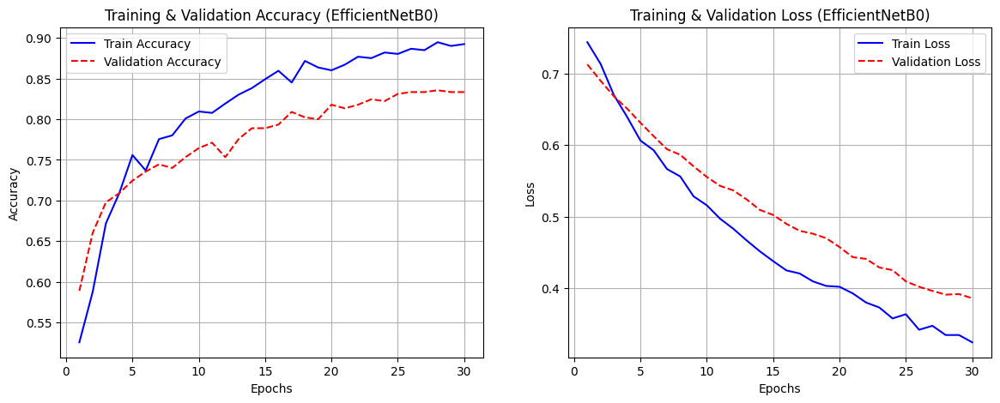

In [30]:
plot_training_history(history_effnet, title_suffix="(EfficientNetB0)")

## MobileNetV2

In [31]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=mobilenet_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [32]:
# Base Model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False

# Model
model_mobilenet = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# First compile
model_mobilenet.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_mobilenet.summary()


# Fine-tuning
for layer in base_model.layers:
    layer.trainable = False  

for layer in base_model.layers[-20:]: 
    layer.trainable = True

# Recompile with lower LR
model_mobilenet.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_mobilenet = model_mobilenet.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,586,177 (9.87 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 673ms/step - accuracy: 0.4939 - loss: 0.8581 - val_accuracy: 0.4689 - val_loss: 0.8195
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 405ms/step - accuracy: 0.6966 - loss: 0.6142 - val_accuracy: 0.5467 - val_loss: 0.7544
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 401ms/step - accuracy: 0.7739 - loss: 0.5289 - val_accuracy: 0.5911 - val_loss: 0.7289
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 402ms/step - accuracy: 0.8099 - loss: 0.4688 - val_accuracy: 0.6311 - val_loss: 0.6823
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 403ms/step - accuracy: 0.8456 - loss: 0.4068 - val_accuracy: 0.6333 - val_loss: 0.6904
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 408ms/step - accuracy: 0.8727 - loss: 0.3662 - val_accuracy: 0.6533 - val_loss: 0.6588
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 22s 405ms/step - accuracy: 0.8822 - loss: 0.3322 - val_accuracy: 0.6822 - val_loss: 0.6161
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 411ms/step - accuracy: 0.8852 - loss: 0.3275 - val_accu

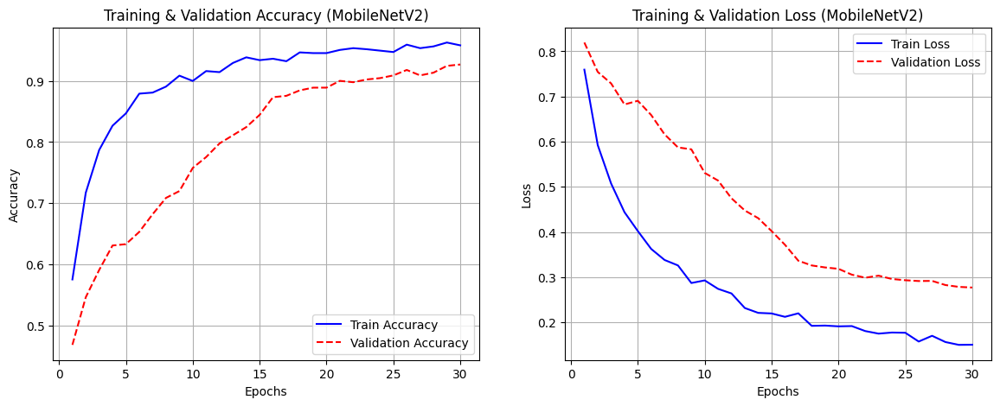

In [33]:
plot_training_history(history_mobilenet, title_suffix="(MobileNetV2)")

## DenseNet169

In [34]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=densenet_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [35]:
# Base model
base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False  

# Model
model_densenet = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model_densenet.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_densenet.summary()

# Fine-tuning
for layer in base_model.layers:
    layer.trainable = False 

for layer in base_model.layers[-20:]:
    layer.trainable = True

model_densenet.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_densenet = model_densenet.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet169 (Functional)        │ (None, 7, 7, 1664)     │    12,642,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1664)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       426,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,069,377 (49.86 MB)

 Trainable params: 426,497 (1.63 MB)

 Non-trainable params: 12,642,880 (48.23 MB)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - accuracy: 0.5581 - loss: 0.8730 - val_accuracy: 0.5933 - val_loss: 0.7181
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 439ms/step - accuracy: 0.6121 - loss: 0.7272 - val_accuracy: 0.6200 - val_loss: 0.6695
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 25s 452ms/step - accuracy: 0.6672 - loss: 0.6643 - val_accuracy: 0.6622 - val_loss: 0.6341
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 439ms/step - accuracy: 0.6892 - loss: 0.6256 - val_accuracy: 0.7044 - val_loss: 0.6064
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 437ms/step - accuracy: 0.7202 - loss: 0.5883 - val_accuracy: 0.7222 - val_loss: 0.5827
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 25s 445ms/step - accuracy: 0.7153 - loss: 0.5887 - val_accuracy: 0.7511 - val_loss: 0.5599
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 442ms/step - accuracy: 0.7680 - loss: 0.5248 - val_accuracy: 0.7400 - val_loss: 0.5392
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 443ms/step - accuracy: 0.7779 - loss: 0.5102 - val_accura

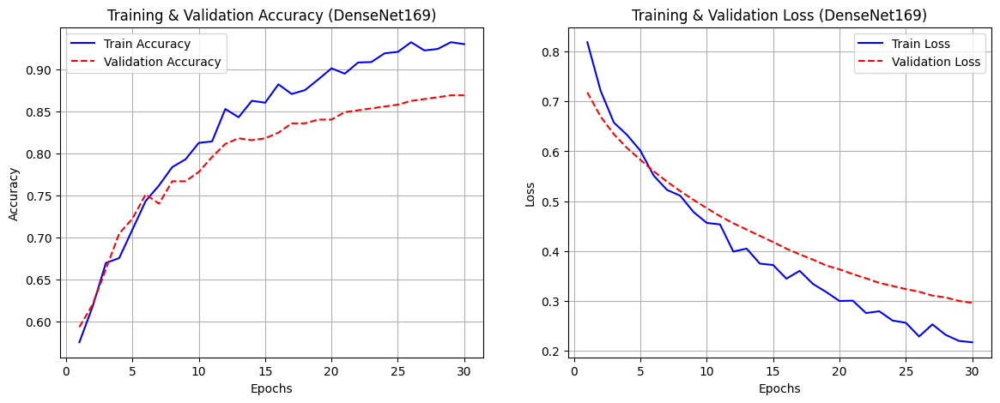

In [36]:
plot_training_history(history_densenet, title_suffix="(DenseNet169)")

## ResNet50

In [37]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=resnet_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [38]:
# Base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False 

# Model
model_resnet = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# First compile
model_resnet.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_resnet.summary()

# Fine-tuning
for layer in base_model.layers:
    layer.trainable = False 

for layer in base_model.layers[-20:]:
    layer.trainable = True

model_resnet.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_resnet = model_resnet.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,112,513 (91.98 MB)

 Trainable params: 524,801 (2.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 65s 727ms/step - accuracy: 0.6097 - loss: 0.7455 - val_accuracy: 0.7467 - val_loss: 0.5431
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 435ms/step - accuracy: 0.7411 - loss: 0.5690 - val_accuracy: 0.8178 - val_loss: 0.4632
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 438ms/step - accuracy: 0.8296 - loss: 0.4350 - val_accuracy: 0.8556 - val_loss: 0.4124
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 437ms/step - accuracy: 0.8702 - loss: 0.3582 - val_accuracy: 0.8578 - val_loss: 0.3801
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 434ms/step - accuracy: 0.8978 - loss: 0.3049 - val_accuracy: 0.8778 - val_loss: 0.3531
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 434ms/step - accuracy: 0.9197 - loss: 0.2498 - val_accuracy: 0.8822 - val_loss: 0.3396
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 25s 444ms/step - accuracy: 0.9387 - loss: 0.2228 - val_accuracy: 0.8978 - val_loss: 0.3146
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 431ms/step - accuracy: 0.9403 - loss: 0.2062 - val_accu

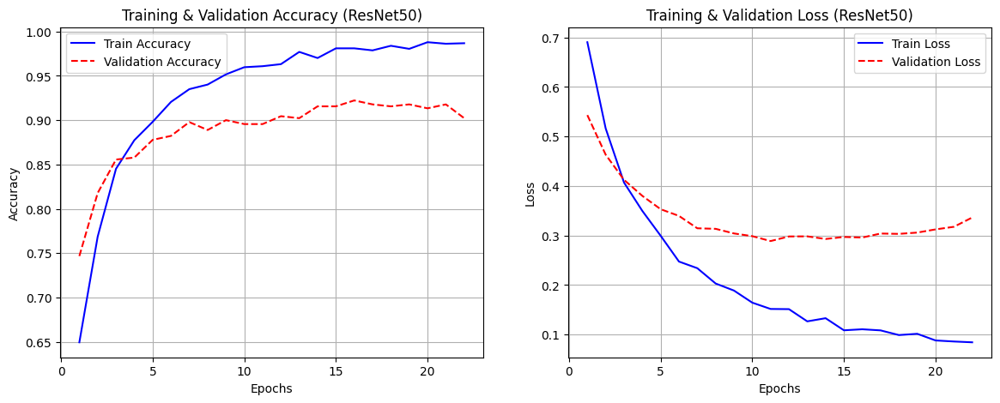

In [39]:
plot_training_history(history_resnet, title_suffix="(ResNet50)")

## VGG16

In [40]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=vgg16_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [41]:
from tensorflow.keras.applications import VGG16

# Base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False 

# Model
model_vgg16 = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# First compile
model_vgg16.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_vgg16.summary()

# Fine-tuning
for layer in base_model.layers:
    layer.trainable = False 

for layer in base_model.layers[-20:]:
    layer.trainable = True

model_vgg16.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_vgg16 = model_vgg16.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,846,273 (56.63 MB)

 Trainable params: 131,585 (514.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.5909 - loss: 1.1670 - val_accuracy: 0.7778 - val_loss: 0.5314
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 596ms/step - accuracy: 0.7546 - loss: 0.5067 - val_accuracy: 0.8667 - val_loss: 0.3809
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 32s 583ms/step - accuracy: 0.8949 - loss: 0.3053 - val_accuracy: 0.9000 - val_loss: 0.2915
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 597ms/step - accuracy: 0.9370 - loss: 0.2017 - val_accuracy: 0.9400 - val_loss: 0.2042
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 585ms/step - accuracy: 0.9549 - loss: 0.1619 - val_accuracy: 0.9311 - val_loss: 0.1797
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 590ms/step - accuracy: 0.9639 - loss: 0.1370 - val_accuracy: 0.9133 - val_loss: 0.2338
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 595ms/step - accuracy: 0.9605 - loss: 0.1319 - val_accuracy: 0.9267 - val_loss: 0.2225
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 598ms/step - accuracy: 0.9718 - loss: 0.1203 - val_accura

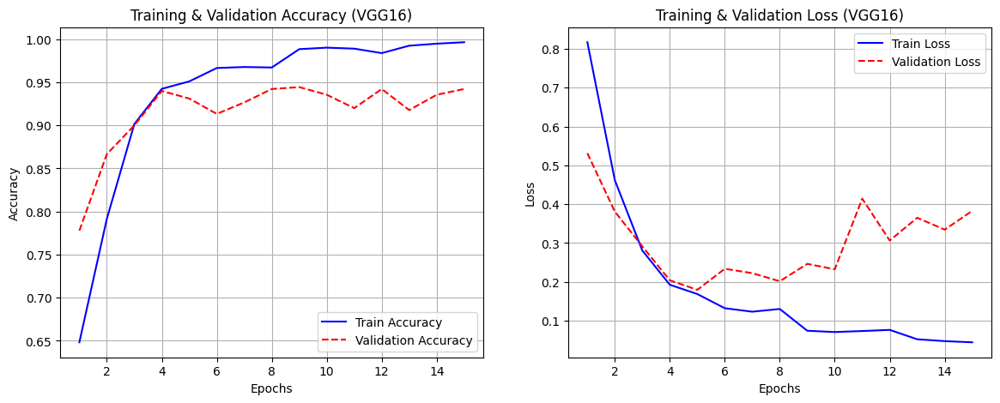

In [42]:
plot_training_history(history_vgg16, title_suffix="(VGG16)")

## InceptionV3

In [43]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=inception_preprocess)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [44]:
# Base model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False

# Model
model_inception = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model_inception.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_inception.summary()

# Fine-tuning
for layer in base_model.layers:
    layer.trainable = False  

for layer in base_model.layers[-20:]:
    layer.trainable = True

model_inception.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-5),
    metrics=['accuracy']
)

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_inception = model_inception.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=len(val_gen),
    callbacks=[es]
)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,327,585 (85.17 MB)

 Trainable params: 524,801 (2.00 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 70s 836ms/step - accuracy: 0.5314 - loss: 0.7681 - val_accuracy: 0.7289 - val_loss: 0.6021
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 431ms/step - accuracy: 0.7085 - loss: 0.6096 - val_accuracy: 0.7733 - val_loss: 0.5428
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 419ms/step - accuracy: 0.7717 - loss: 0.5432 - val_accuracy: 0.7933 - val_loss: 0.5096
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 423ms/step - accuracy: 0.7974 - loss: 0.4761 - val_accuracy: 0.7978 - val_loss: 0.4916
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 418ms/step - accuracy: 0.8157 - loss: 0.4687 - val_accuracy: 0.8000 - val_loss: 0.4771
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 424ms/step - accuracy: 0.8299 - loss: 0.4318 - val_accuracy: 0.7978 - val_loss: 0.4687
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 425ms/step - accuracy: 0.8556 - loss: 0.4059 - val_accuracy: 0.8022 - val_loss: 0.4636
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 424ms/step - accuracy: 0.8579 - loss: 0.4008 - val_accu

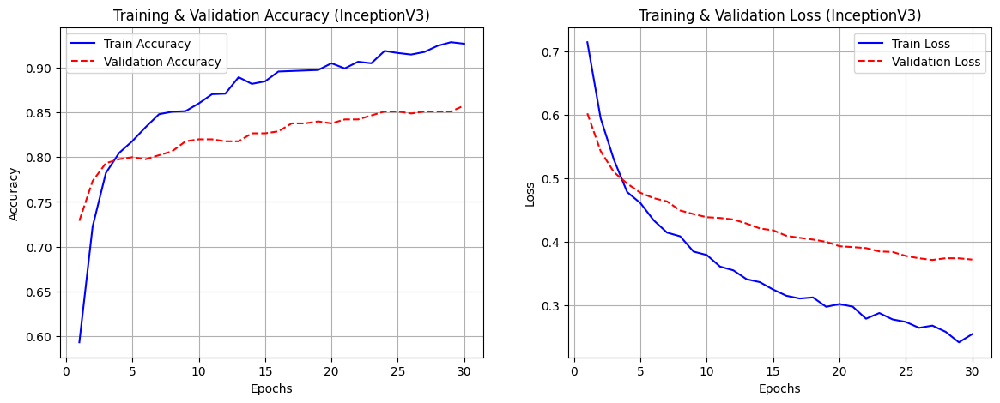

In [45]:
plot_training_history(history_inception, title_suffix="(InceptionV3)")

## Custom CNN

In [63]:
train_gen_cnn, val_gen_cnn = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=None)
print("train_generator.class_indices: ", train_gen_cnn.class_indices)
print("steps_per_epoch: ", len(train_gen_cnn))
print("validation_steps:", len(val_gen_cnn))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [64]:
# Model
model_custom = Sequential([
    layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(224,224,3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(256, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile
model_custom.compile(
    optimizer=Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_custom.summary()

# Callbacks
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

# Fit
EPOCHS = 30
history_custom_cnn = model_custom.fit(
    train_gen_cnn,
    steps_per_epoch=len(train_gen_cnn),
    epochs=EPOCHS,
    validation_data=val_gen_cnn,
    validation_steps=len(val_gen_cnn),
    callbacks=[es]
)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,235,905 (50.49 MB)

 Trainable params: 13,234,945 (50.49 MB)

 Non-trainable params: 960 (3.75 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 34s 474ms/step - accuracy: 0.5873 - loss: 1.6049 - val_accuracy: 0.5733 - val_loss: 0.7637
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 418ms/step - accuracy: 0.6617 - loss: 0.7118 - val_accuracy: 0.6800 - val_loss: 0.7715
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 423ms/step - accuracy: 0.6972 - loss: 0.6913 - val_accuracy: 0.6822 - val_loss: 0.6848
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 421ms/step - accuracy: 0.7080 - loss: 0.6410 - val_accuracy: 0.6978 - val_loss: 0.6624
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 423ms/step - accuracy: 0.7043 - loss: 0.6458 - val_accuracy: 0.7289 - val_loss: 0.6343
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 418ms/step - accuracy: 0.7259 - loss: 0.6151 - val_accuracy: 0.7044 - val_loss: 0.6333
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 416ms/step - accuracy: 0.7385 - loss: 0.6019 - val_accuracy: 0.6667 - val_loss: 0.6437
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 420ms/step - accuracy: 0.7281 - loss: 0.6062 - val_accu

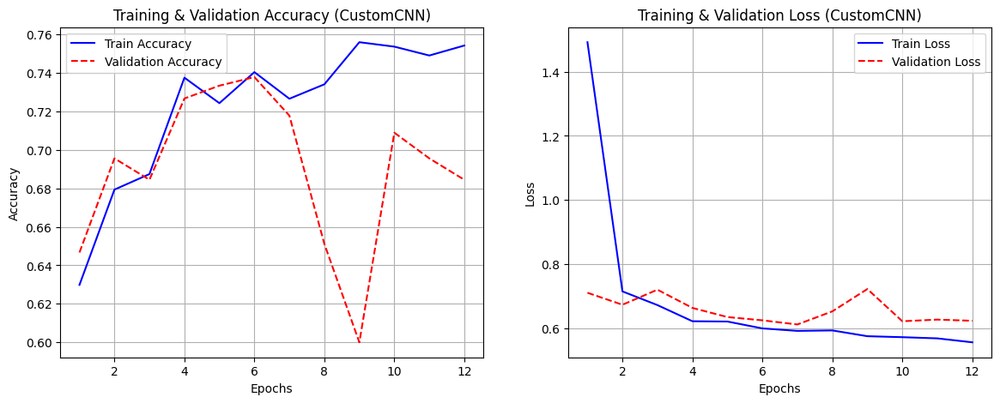

In [48]:
plot_training_history(history_custom_cnn, title_suffix="(CustomCNN)")

## Updated CNN (Keras Turner with Bayesian Optimization)

In [49]:
train_gen, val_gen = get_generators(TRAIN_MERGE_DIR, VAL_MERGE_DIR, IMG_SIZE, 32, RANDOM_SEED, preprocess_func=None)
print("train_generator.class_indices: ", train_gen.class_indices)
print("steps_per_epoch: ", len(train_gen))
print("validation_steps:", len(val_gen))

Found 1737 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
train_generator.class_indices:  {'NO': 0, 'YES': 1}
steps_per_epoch:  55
validation_steps: 29


In [50]:
def build_model(hp):
    model_tuner = Sequential([
        layers.Conv2D(
            filters=hp.Choice('conv1_filters', [32, 64]),
            kernel_size=(3,3),
            activation='relu',
            padding='same',
            input_shape=(224,224,3)
        ),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(
            filters=hp.Choice('conv2_filters', [64, 128]),
            kernel_size=(3,3),
            activation='relu',
            padding='same'
        ),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(
            filters=hp.Choice('conv3_filters', [128, 256]),
            kernel_size=(3,3),
            activation='relu',
            padding='same'
        ),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),

        layers.Flatten(),
        layers.Dense(
            units=hp.Choice('dense_units', [128, 256, 512]),
            activation='relu',
            kernel_regularizer=regularizers.l2(1e-4)
        ),
        layers.Dropout(hp.Choice('dropout_rate', [0.3, 0.5])),
        layers.Dense(1, activation='sigmoid')
    ])

    model_tuner.compile(
        optimizer=Adam(
            learning_rate=hp.Float('learning_rate', 1e-5, 1e-3, sampling='log')
        ),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model_tuner

tuner = kt.BayesianOptimization(
    build_model,
    objective='val_accuracy',
    max_trials=3,  # different combination
    directory='tuner_dir',
    project_name='custom_cnn_bayes'
)

es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=6,
    restore_best_weights=True
)

tuner.search(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=val_gen,
    validation_steps=len(val_gen),
    epochs=5, 
    callbacks=[es]
)

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best hyperparameters:")
print("Conv1 filters:", best_hps.get('conv1_filters'))
print("Conv2 filters:", best_hps.get('conv2_filters'))
print("Conv3 filters:", best_hps.get('conv3_filters'))
print("Dense units:", best_hps.get('dense_units'))
print("Dropout:", best_hps.get('dropout_rate'))
print("Learning rate:", best_hps.get('learning_rate'))

# Final model
model_tuner = tuner.hypermodel.build(best_hps)
history_tuner_bayesian = model_tuner.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=val_gen,
    validation_steps=len(val_gen),
    epochs=10, 
    callbacks=[es]
)

Trial 5 Complete [00h 02m 12s]
val_accuracy: 0.653333306312561

Best val_accuracy So Far: 0.7488889098167419
Total elapsed time: 00h 11m 37s
Best hyperparameters:
Conv1 filters: 32
Conv2 filters: 128
Conv3 filters: 128
Dense units: 256
Dropout: 0.5
Learning rate: 5.93754591970223e-05
Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 485ms/step - accuracy: 0.5851 - loss: 1.6839 - val_accuracy: 0.6022 - val_loss: 0.7835
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 424ms/step - accuracy: 0.6566 - loss: 0.7182 - val_accuracy: 0.7133 - val_loss: 0.6466
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 427ms/step - accuracy: 0.7089 - loss: 0.6631 - val_accuracy: 0.7178 - val_loss: 0.6430
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 421ms/step - accuracy: 0.7150 - loss: 0.6152 - val_accuracy: 0.7111 - val_loss: 0.6565
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 419ms/step - accuracy: 0.7064 - loss: 0.6513 - val_accuracy: 0.7178 - val_loss: 0.6577
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 414ms/step - accuracy: 0.735

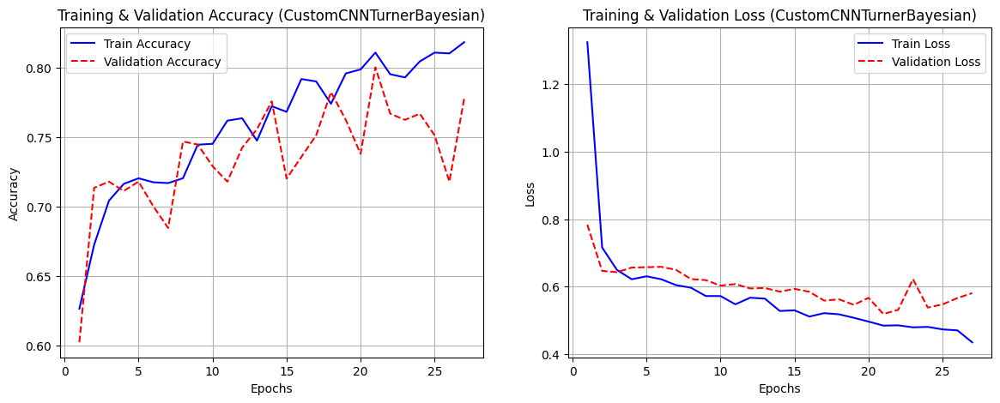

In [51]:
plot_training_history(history_tuner_bayesian, title_suffix="(CustomCNNTurnerBayesian)")

## Results

### Performance Plot Model

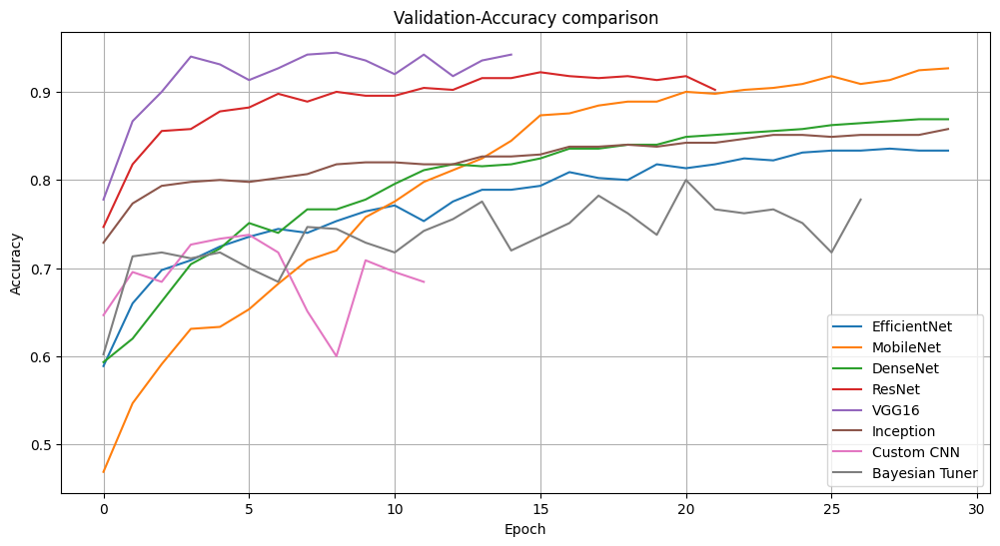

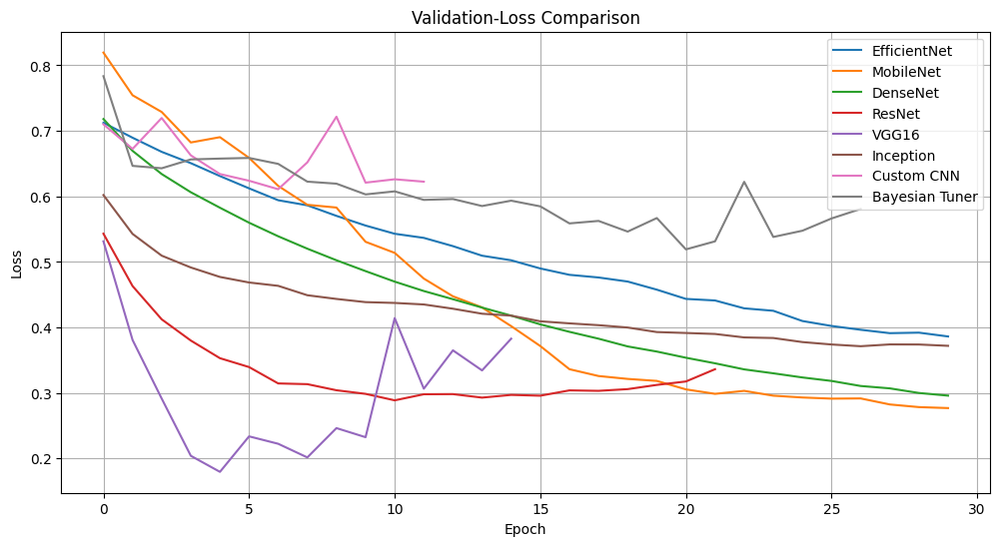

In [52]:
histories = {
    "EfficientNet": history_effnet,
    "MobileNet": history_mobilenet,
    "DenseNet": history_densenet,
    "ResNet": history_resnet,
    "VGG16": history_vgg16,
    "Inception": history_inception,
    "Custom CNN": history_custom_cnn,
    "Bayesian Tuner": history_tuner_bayesian
}

# Validation-Accuracy comparison
plt.figure(figsize=(12, 6))
for name, hist in histories.items():
    plt.plot(hist.history['val_accuracy'], label=name)
plt.title("Validation-Accuracy comparison")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Validation-Loss comparison
plt.figure(figsize=(12, 6))
for name, hist in histories.items():
    plt.plot(hist.history['val_loss'], label=name)
plt.title("Validation-Loss Comparison")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

### Matrix

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


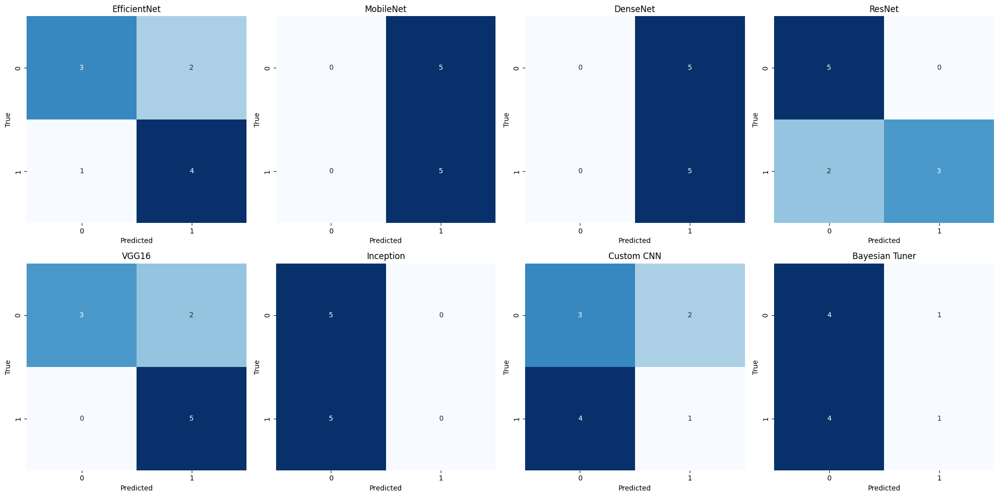

In [53]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

models = {
    "EfficientNet": model_effnet,
    "MobileNet": model_mobilenet,
    "DenseNet": model_densenet,
    "ResNet": model_resnet,
    "VGG16": model_vgg16,
    "Inception": model_inception,
    "Custom CNN": model_custom,
    "Bayesian Tuner": model_tuner
}

fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # 2 row 4 column (8 model)
axes = axes.flatten()

for i, (name, model) in enumerate(models.items()):
    y_pred = (model.predict(X_test) > 0.5).astype("int32")
    cm = confusion_matrix(y_test, y_pred)

    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[i])
    axes[i].set_title(name)
    axes[i].set_xlabel("Predicted")
    axes[i].set_ylabel("True")

plt.tight_layout()
plt.show()

In [54]:
from sklearn.metrics import classification_report

def print_classification_reports(models, X_test, y_test, selected_models=None):
    for name, model in models.items():
        if selected_models and name not in selected_models:
            continue
        
        y_pred = (model.predict(X_test) > 0.5).astype("int32")
        print(f"\n--- Classification Report: {name} ---\n")
        print(classification_report(y_test, y_pred, digits=4))

print_classification_reports(models, X_test, y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

--- Classification Report: EfficientNet ---

              precision    recall  f1-score   support

           0     0.7500    0.6000    0.6667         5
           1     0.6667    0.8000    0.7273         5

    accuracy                         0.7000        10
   macro avg     0.7083    0.7000    0.6970        10
weighted avg     0.7083    0.7000    0.6970        10

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

--- Classification Report: MobileNet ---

              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         5
           1     0.5000    1.0000    0.6667         5

    accuracy                         0.5000        10
   macro avg     0.2500    0.5000    0.3333        10
weighted avg     0.2500    0.5000    0.3333        10

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

--- Classification Report: DenseNet ---

              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classif

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

--- Classification Report: ResNet ---

              precision    recall  f1-score   support

           0     0.7143    1.0000    0.8333         5
           1     1.0000    0.6000    0.7500         5

    accuracy                         0.8000        10
   macro avg     0.8571    0.8000    0.7917        10
weighted avg     0.8571    0.8000    0.7917        10

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

--- Classification Report: VGG16 ---

              precision    recall  f1-score   support

           0     1.0000    0.6000    0.7500         5
           1     0.7143    1.0000    0.8333         5

    accuracy                         0.8000        10
   macro avg     0.8571    0.8000    0.7917        10
weighted avg     0.8571    0.8000    0.7917        10

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

--- Classification Report: Inception ---

              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667         5
 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

--- Classification Report: Bayesian Tuner ---

              precision    recall  f1-score   support

           0     0.5000    0.8000    0.6154         5
           1     0.5000    0.2000    0.2857         5

    accuracy                         0.5000        10
   macro avg     0.5000    0.5000    0.4505        10
weighted avg     0.5000    0.5000    0.4505        10



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


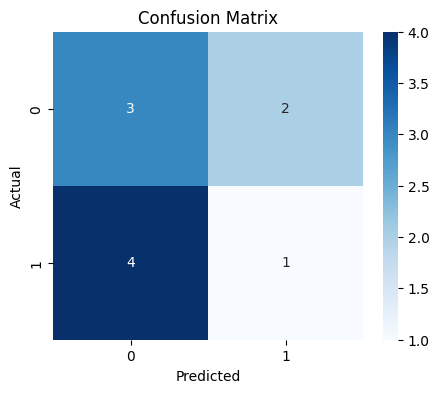

In [55]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(model, X_test, y_test, class_names=["0", "1"]):
    y_pred = (model.predict(X_test) > 0.5).astype("int32")
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.title(f"Confusion Matrix")
    plt.show()

plot_confusion_matrix(model_custom, X_test, y_test)

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2

def force_build_model(model):
    """
    Force model to build by making a prediction
    """
    dummy_input = tf.random.normal((1, 224, 224, 3))
    _ = model.predict(dummy_input, verbose=0)
    return model

def create_functional_gradcam_model(original_model, layer_name):
    """
    Create a functional model for Grad-CAM from Sequential model
    
    Args:
        original_model: Your trained Sequential model
        layer_name: Name of the conv layer to analyze
    
    Returns:
        gradcam_model: Functional model for Grad-CAM
    """
    
    # Force build the original model
    force_build_model(original_model)
    
    # Get the layer index
    layer_names = [layer.name for layer in original_model.layers]
    if layer_name not in layer_names:
        raise ValueError(f"Layer {layer_name} not found. Available: {layer_names}")
    
    layer_idx = layer_names.index(layer_name)
    
    # Create input
    inputs = keras.Input(shape=(224, 224, 3))
    x = inputs
    
    # Rebuild layers up to target layer
    for i, layer in enumerate(original_model.layers):
        if hasattr(layer, 'get_weights') and layer.get_weights():
            # Copy weights from original layer
            if isinstance(layer, keras.layers.Conv2D):
                new_layer = keras.layers.Conv2D(
                    filters=layer.filters,
                    kernel_size=layer.kernel_size,
                    strides=layer.strides,
                    padding=layer.padding,
                    activation=layer.activation,
                    name=layer.name + "_copy"
                )
            elif isinstance(layer, keras.layers.Dense):
                new_layer = keras.layers.Dense(
                    units=layer.units,
                    activation=layer.activation,
                    name=layer.name + "_copy"
                )
            elif isinstance(layer, keras.layers.BatchNormalization):
                new_layer = keras.layers.BatchNormalization(name=layer.name + "_copy")
            else:
                continue
                
            x = new_layer(x)
            # Set weights after building
            new_layer.set_weights(layer.get_weights())
            
        else:
            # Non-trainable layers
            if isinstance(layer, keras.layers.MaxPooling2D):
                x = keras.layers.MaxPooling2D(
                    pool_size=layer.pool_size,
                    strides=layer.strides,
                    padding=layer.padding,
                    name=layer.name + "_copy"
                )(x)
            elif isinstance(layer, keras.layers.Flatten):
                x = keras.layers.Flatten(name=layer.name + "_copy")(x)
            elif isinstance(layer, keras.layers.Dropout):
                x = keras.layers.Dropout(layer.rate, name=layer.name + "_copy")(x)
        
        # Save conv layer output for Grad-CAM
        if i == layer_idx:
            conv_output = x
    
    # Complete the model
    model_output = x
    
    # Create the Grad-CAM model
    gradcam_model = keras.Model(inputs=inputs, outputs=[conv_output, model_output])
    
    return gradcam_model

def manual_gradcam(model, image_path, layer_name):
    """
    Manual Grad-CAM implementation that works with Sequential models
    """
    
    try:
        # Force build model
        force_build_model(model)
        
        # Load and preprocess image
        img = keras.utils.load_img(image_path, target_size=(224, 224))
        img_array = keras.utils.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        
        # Get prediction first
        prediction = model.predict(img_array, verbose=0)
        pred_class = "Positive" if prediction[0][0] > 0.5 else "Negative"
        confidence = prediction[0][0] if prediction[0][0] > 0.5 else 1 - prediction[0][0]
        
        print(f"Prediction: {pred_class} ({confidence:.3f})")
        
        # Manual feature extraction approach
        # Build a truncated model up to the target layer
        layer_names = [layer.name for layer in model.layers]
        if layer_name not in layer_names:
            print(f"Layer {layer_name} not found. Available: {layer_names}")
            return
        
        layer_idx = layer_names.index(layer_name)
        
        # Create a new model that outputs the target layer
        temp_model = keras.Sequential()
        for i in range(layer_idx + 1):
            layer = model.layers[i]
            temp_model.add(layer)
        
        # Get feature maps
        feature_maps = temp_model.predict(img_array, verbose=0)
        
        # Simple visualization of feature maps (not true Grad-CAM but similar)
        # Average across all feature maps
        if len(feature_maps.shape) == 4:  # (batch, height, width, channels)
            heatmap = np.mean(feature_maps[0], axis=-1)
        else:
            print("Cannot create heatmap - layer output is not 4D")
            return
        
        # Normalize
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
        
        # Resize to input image size
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        
        # Visualize
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Original
        axes[0].imshow(img)
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        
        # Heatmap
        im1 = axes[1].imshow(heatmap_resized, cmap='jet')
        axes[1].set_title(f'Feature Map Activation\n{layer_name}')
        axes[1].axis('off')
        plt.colorbar(im1, ax=axes[1])
        
        # Overlay
        axes[2].imshow(img)
        axes[2].imshow(heatmap_resized, cmap='jet', alpha=0.5)
        axes[2].set_title(f'Overlay\n{pred_class} ({confidence:.3f})')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        return heatmap_resized
        
    except Exception as e:
        print(f"Error in manual_gradcam: {e}")
        return None

def simple_activation_visualization(model, image_path, layer_name):
    """
    Simplified activation visualization without gradients
    This shows which parts of the image activate the conv layer most
    """
    
    # Force build
    force_build_model(model)
    
    # Load image
    img = keras.utils.load_img(image_path, target_size=(224, 224))
    img_array = keras.utils.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    
    # Get layer index
    layer_names = [layer.name for layer in model.layers]
    if layer_name not in layer_names:
        print(f"Layer {layer_name} not found. Available: {layer_names}")
        return
    
    layer_idx = layer_names.index(layer_name)
    
    # Create intermediate model
    intermediate_model = keras.Model(
        inputs=model.input,
        outputs=model.layers[layer_idx].output
    )
    
    # Get activations
    activations = intermediate_model.predict(img_array, verbose=0)
    
    # Create heatmap from activations
    if len(activations.shape) == 4:
        # Average across channels
        heatmap = np.mean(activations[0], axis=-1)
        
        # Normalize
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
        
        # Resize
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        
        # Get prediction
        pred = model.predict(img_array, verbose=0)
        pred_class = "Positive" if pred[0][0] > 0.5 else "Negative"
        confidence = pred[0][0] if pred[0][0] > 0.5 else 1 - pred[0][0]
        
        # Visualize
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        axes[0].imshow(img)
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        im = axes[1].imshow(heatmap_resized, cmap='hot')
        axes[1].set_title(f'Activations\n{layer_name}')
        axes[1].axis('off')
        plt.colorbar(im, ax=axes[1])
        
        axes[2].imshow(img)
        axes[2].imshow(heatmap_resized, cmap='hot', alpha=0.4)
        axes[2].set_title(f'{pred_class}\n{confidence:.3f}')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"Layer: {layer_name}")
        print(f"Activation shape: {activations.shape}")
        print(f"Prediction: {pred_class} ({confidence:.3f})")
        
        return heatmap_resized
    
    else:
        print(f"Cannot visualize layer {layer_name} - not a 4D activation")
        return None

Prediction: Positive (0.720)


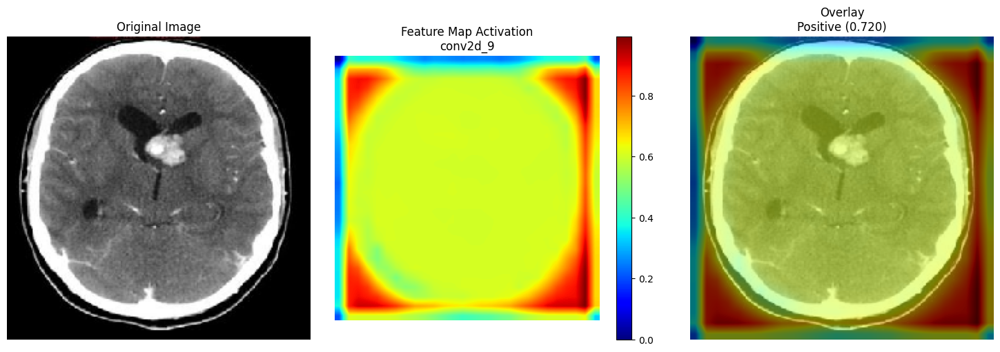

array([[0.        , 0.        , 0.        , ..., 0.20124198, 0.20124198,
        0.20124198],
       [0.        , 0.        , 0.        , ..., 0.20124198, 0.20124198,
        0.20124198],
       [0.        , 0.        , 0.        , ..., 0.20124198, 0.20124198,
        0.20124198],
       ...,
       [0.20552483, 0.20552483, 0.20552483, ..., 0.33035427, 0.33035427,
        0.33035427],
       [0.20552483, 0.20552483, 0.20552483, ..., 0.33035427, 0.33035427,
        0.33035427],
       [0.20552483, 0.20552483, 0.20552483, ..., 0.33035427, 0.33035427,
        0.33035427]], dtype=float32)

In [104]:
manual_gradcam(model_custom, "/kaggle/working/TEST_MERGED/NO/TEST_0_N1.JPG", "conv2d_9")

## Clean up & Save

In [106]:
# clean up the space
#!rm -rf TRAIN TEST VAL TRAIN_CROP TEST_CROP VAL_CROP
# save the model
# model.save('2025-09-25_VGG_model.h5')
print("DONE")

DONE
